In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
#read the excel file
housing = pd.read_excel("housing.xlsx")

In [3]:
#View first few rows of the dataset
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-122.23,37.88,41,880,129.0,322,126,8.3252,NEAR BAY,452600
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,NEAR BAY,358500
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,NEAR BAY,352100
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,NEAR BAY,341300
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,NEAR BAY,342200


It can be observed from this dataset that one training example represents a small colony or district or suburb which contains multiple households, each with different number of total rooms, total bedrooms, population and number of households. Let's call this a district. The households have different incomes, so for a district, median income has been calculated. The task is to predict median income of a district given the above attributes. 

In [4]:
housing.shape

(20640, 10)

In [5]:
housing.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [6]:
housing.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
ocean_proximity         0
median_house_value      0
dtype: int64

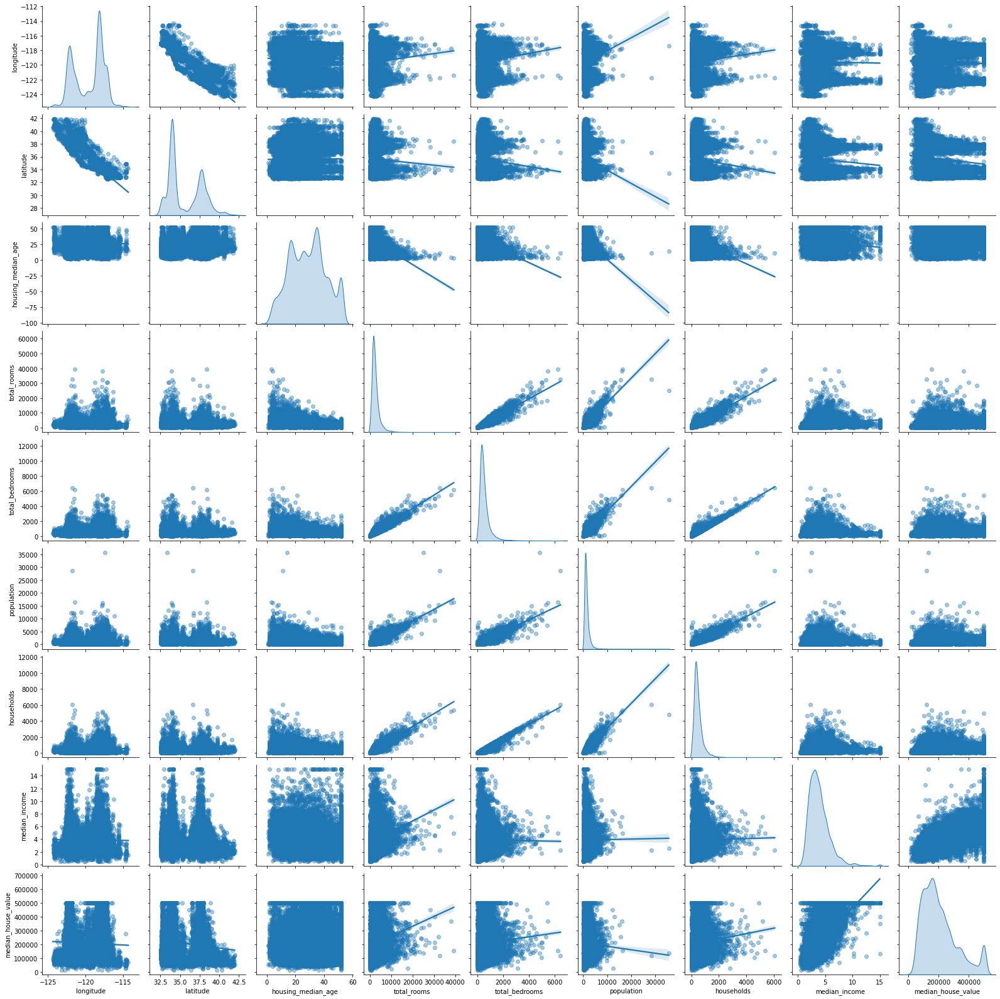

In [7]:
sns.pairplot(housing, kind = 'reg', diag_kind='kde', plot_kws={'scatter_kws': {'alpha': 0.4}})

## Analyzing 'ocean_proximity'

#### 1. What is the average median household cost of districts in different proximities to ocean?

In [8]:
proximity_cost = housing.groupby(['ocean_proximity']).mean()['median_house_value']
proximity_cost

ocean_proximity
<1H OCEAN     240084.285464
INLAND        124805.392001
ISLAND        380440.000000
NEAR BAY      259212.311790
NEAR OCEAN    249433.977427
Name: median_house_value, dtype: float64

[Text(0.5, 0, 'Proximity to ocean'), Text(0, 0.5, 'Median Housing Cost')]

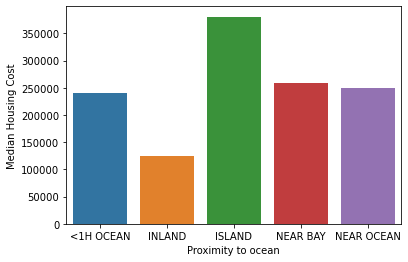

In [9]:
ax = sns.barplot(x = proximity_cost.index, y=proximity_cost.values)
ax.set(xlabel = "Proximity to ocean", ylabel = "Median Housing Cost")

The average housing cost is highest in ISLAND and lowest in INLAND. Let's take a look at how these prices are distributed within each locality. 

#### 2. How are the prices distributed within each locality?

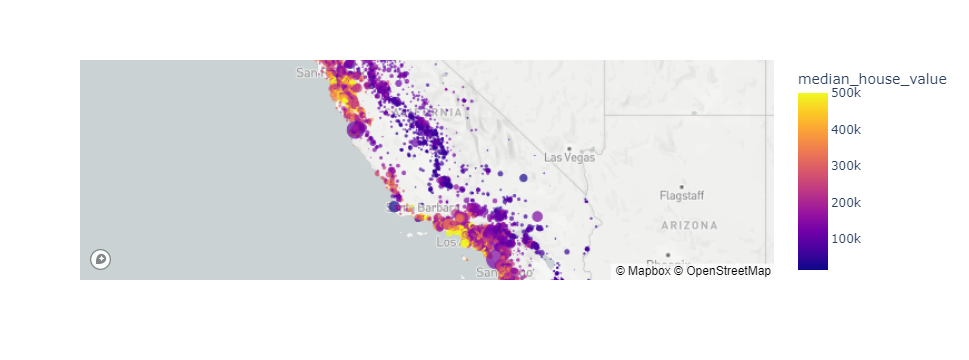

In [10]:
px.set_mapbox_access_token(open(".mapbox_token.txt").read())
fig = px.scatter_mapbox(housing, lat="latitude", lon="longitude", color="median_house_value", size="population",
                   size_max=15, zoom=4.5)
fig.show()

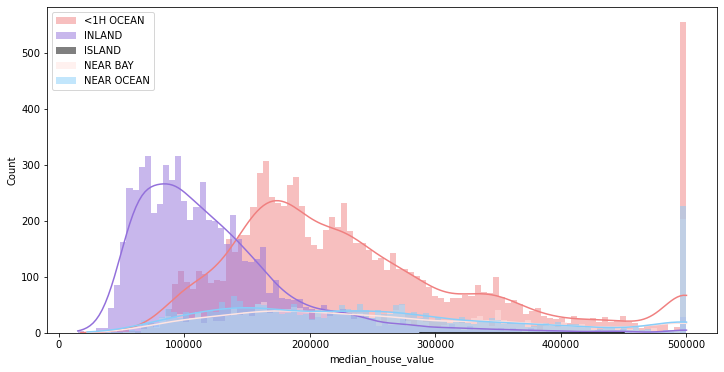

In [11]:
plt.figure(figsize=(12,6))
plt.rcParams['patch.edgecolor'] = 'none'
colors = ['lightcoral','mediumpurple','black','mistyrose','lightskyblue']
for i,col in enumerate(proximity_cost.index):
    sns.histplot(housing['median_house_value'].where(housing['ocean_proximity']==col), 
                 bins=100, label=col, color=colors[i], kde=True)
plt.legend()

<AxesSubplot:xlabel='ocean_proximity', ylabel='median_house_value'>

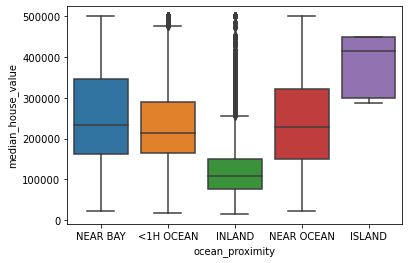

In [12]:
sns.boxplot(x="ocean_proximity", y = "median_house_value", data = housing)

NEAR BAY and NEAR OCEAN are almost identically distributed. While in INLAND the median and average housing cost is low and most of the houses lie between 100k and 200k, there's a good amount of outliers as well. It could be the case that INLAND has some sub locality where the prices are exceptionally high, or due to other factors, which need to be investigated. If we define them as POSH localities i.e. having the same housing price as that of ISLAND =  400000, we can know the percentage of such houses. 


In [13]:
housing[(housing['ocean_proximity']=="<1H OCEAN") & (housing['median_house_value']>400000)]['median_house_value'].count()

929

In [14]:
housing[(housing['ocean_proximity']=="NEAR OCEAN") & (housing['median_house_value']>400000)]['median_house_value'].count()

380

In [15]:
380/2658

0.14296463506395787

929/9136 * 100 = 10.16%. This means roughly 10 % of localities in <1H Ocean are highly priced, while 380/2658 * 100 = 14 % of localities in NEAR OCEAN are highly priced, indicative of presence of posh sub localities. This indicates that the problem is indeed multivariate and there are other factors into play which affect the house prices. However, it is clear that these cannot be considered as outliers and present important information. 


#### 3. How are the districts distributed in different proximities?

In [16]:
proximity_count = housing['ocean_proximity'].value_counts()
proximity_count_perc = housing['ocean_proximity'].value_counts(normalize=True)*100
pd.DataFrame({"count": proximity_count, "percentage": proximity_count_perc}, index=proximity_count.index)

,count,percentage
<1H OCEAN,9136,44.263566
INLAND,6551,31.739341
NEAR OCEAN,2658,12.877907
NEAR BAY,2290,11.094961
ISLAND,5,0.024225


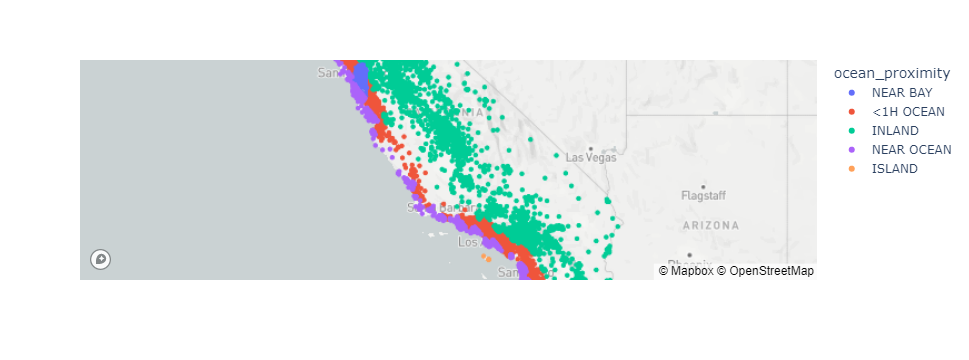

In [17]:
px.set_mapbox_access_token(open(".mapbox_token.txt").read())
fig = px.scatter_mapbox(housing, lat="latitude", lon="longitude", color="ocean_proximity",
                   size_max=15, zoom=4.5)
fig.show()

Out of 20000 examples we have only 0.02% examples for ISLAND and nearly 75% examples are from <1H OCEAN and INLAND. The <1H OCEAN is densely populated as compared to INLAND. It might be interesting to see the distribution of median income with respect to ocean_proximity.

#### 4. What is the distribution of median income in different proximities?

In [18]:
proximity_income = housing.groupby('ocean_proximity').mean()['median_income']
proximity_income

ocean_proximity
<1H OCEAN     4.230682
INLAND        3.208996
ISLAND        2.744420
NEAR BAY      4.172885
NEAR OCEAN    4.005785
Name: median_income, dtype: float64

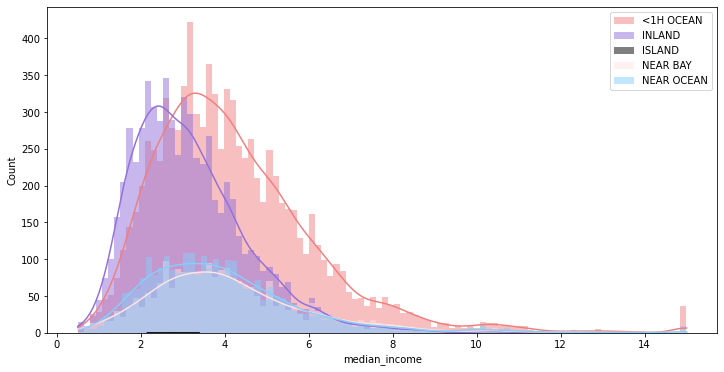

In [19]:
plt.figure(figsize=(12,6))
plt.rcParams['patch.edgecolor'] = 'none'
colors = ['lightcoral','mediumpurple','black','mistyrose','lightskyblue']
for i,col in enumerate(proximity_income.index):
    sns.histplot(housing['median_income'].where(housing['ocean_proximity']==col), 
                 bins=100, label=col, color=colors[i], kde=True)
plt.legend()

<AxesSubplot:xlabel='ocean_proximity', ylabel='median_income'>

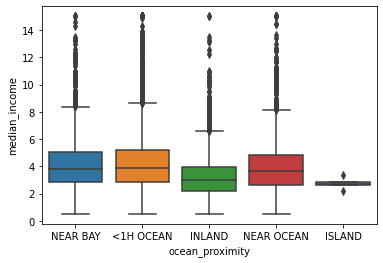

In [20]:
sns.boxplot(x="ocean_proximity", y = "median_income", data = housing)

In all localities except the ISLAND, the income varies from very low to vary high. In ISLAND on the other hand, the income is very fixed. 

In [21]:
#It seems like age is not much of a factor as the median age of house remains the same. However, mean population is vastly different (lower in posh), mean income differs by a factor of 2. In fact, these might be two different populations. 

In [22]:
# housing = pd.concat([housing.drop(columns=['ocean_proximity']),pd.get_dummies(housing['ocean_proximity'])], axis = 1)
# housing.drop(columns = ['ISLAND'], inplace=True)
# housing.head()

<AxesSubplot:>

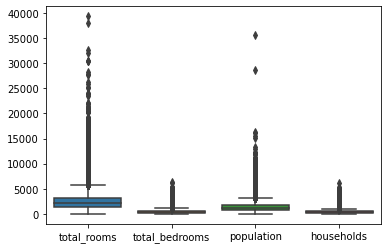

In [23]:
sns.boxplot(data=housing[['total_rooms', 'total_bedrooms','population','households']])

In [24]:
from sklearn.model_selection import train_test_split

In [25]:
X = housing.drop(columns=['median_house_value'])
y = housing['median_house_value']

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.4,stratify=X['ocean_proximity'])
X_dev, X_test, y_dev, y_test = train_test_split(X_test, y_test, test_size=0.5, stratify=X_test['ocean_proximity'])

## Imputation of missing values

In [27]:
train_params = X_train.describe()
X_train['total_bedrooms'].fillna(train_params.loc['mean','total_bedrooms'], inplace=True)
X_dev['total_bedrooms'].fillna(train_params.loc['mean','total_bedrooms'], inplace=True)
train_params.to_csv("train_params.csv", index=True)

## Correlation Analysis

First check if distribution of different variables remain same after split

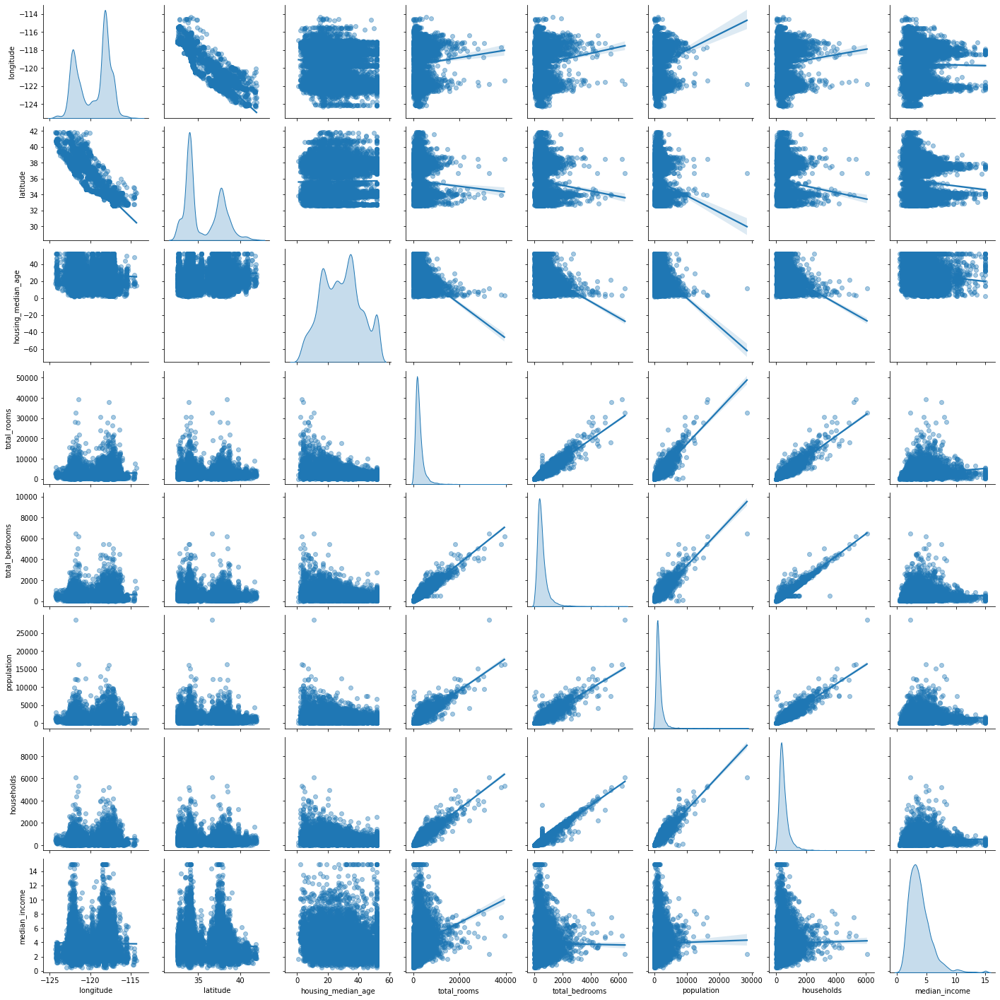

In [28]:
sns.pairplot(X_train, kind = 'reg', diag_kind='kde', plot_kws={'scatter_kws': {'alpha': 0.4}})

### 1. Pearson Correlation

In [29]:
corr = X_train.drop(columns=['ocean_proximity']).corr()
corr

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
longitude,1.000000,-0.923812,-0.111236,0.045702,0.072882,0.100565,0.057344,-0.014542
latitude,-0.923812,1.000000,0.015520,-0.036706,-0.068075,-0.109771,-0.071544,-0.083491
housing_median_age,-0.111236,0.015520,1.000000,-0.358683,-0.319462,-0.299610,-0.304908,-0.124546
total_rooms,0.045702,-0.036706,-0.358683,1.000000,0.927327,0.867474,0.919069,0.194062
total_bedrooms,0.072882,-0.068075,-0.319462,0.927327,1.000000,0.881809,0.973480,-0.008925
population,0.100565,-0.109771,-0.299610,0.867474,0.881809,1.000000,0.914816,0.009794
households,0.057344,-0.071544,-0.304908,0.919069,0.973480,0.914816,1.000000,0.012881
median_income,-0.014542,-0.083491,-0.124546,0.194062,-0.008925,0.009794,0.012881,1.000000


<AxesSubplot:>

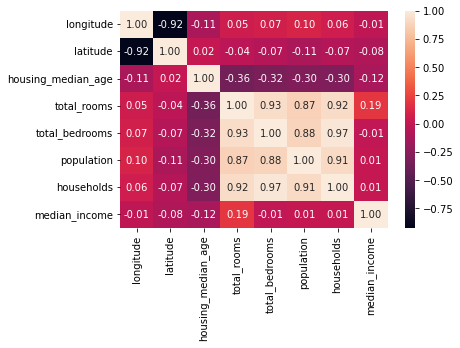

In [30]:
sns.heatmap(corr, annot=True, fmt='.2f')

**total_rooms - households - population - total_bedrooms are all correlated with each other**

**latitude - longitude are highly correlated with each other**


### 2. Variance Inflation Factor

In [31]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

In [32]:
C = add_constant(X_train.drop(columns=['ocean_proximity']))
pd.Series([variance_inflation_factor(C.values, i) 
               for i in range(C.shape[1])], 
              index=C.columns)

const                 16628.924714
longitude                 8.612899
latitude                  8.740824
housing_median_age        1.256668
total_rooms              12.153976
total_bedrooms           25.976613
population                6.836237
households               27.705178
median_income             1.679130
dtype: float64

## Feature Selection and Feature Engineering

### 1. Dummy encoding

In [33]:
X_train = pd.get_dummies(X_train, columns=['ocean_proximity'])
X_train.drop(columns=['ocean_proximity_ISLAND'], inplace=True)
X_dev = pd.get_dummies(X_dev, columns=['ocean_proximity'])
X_dev.drop(columns=['ocean_proximity_ISLAND'], inplace=True)
X_test = pd.get_dummies(X_test, columns=['ocean_proximity'])
X_test.drop(columns=['ocean_proximity_ISLAND'], inplace=True)

### Create Baseline Model

In [34]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler

In [142]:
def evaluate(model, Xtrain, ytrain, Xdev, ydev):
    mean = Xtrain.mean()
    std = Xtrain.std()
    Xtrain = (Xtrain - mean)/std
    Xdev = (Xdev - mean)/std
    model.fit(Xtrain, ytrain)
    ypred_train = model.predict(Xtrain)
    ypred_dev = model.predict(Xdev)
    train_r2 = r2_score(ytrain,ypred_train)
    train_rmse = np.sqrt(mean_squared_error(ytrain,ypred_train))
    train_score = (train_r2,train_rmse)
    dev_r2 = r2_score(ydev,ypred_dev)
    dev_rmse = np.sqrt(mean_squared_error(ydev,ypred_dev))
    dev_score = (dev_r2,dev_rmse)
    
    results = {'Train': train_score, 'Dev': dev_score}
    
    return results

In [101]:
X_train0, X_dev0 = X_train.copy(), X_dev.copy()

In [143]:
modelbase = LinearRegression()
evaluate(modelbase,X_train0,y_train,X_dev0,y_dev)

{'Train': (0.6487661132595093, 67995.62101205379),
 'Dev': (0.6306470504452024, 70735.09817775576)}

### Feature Engineering Latitude-Longitude using Gaussian Mixture Models

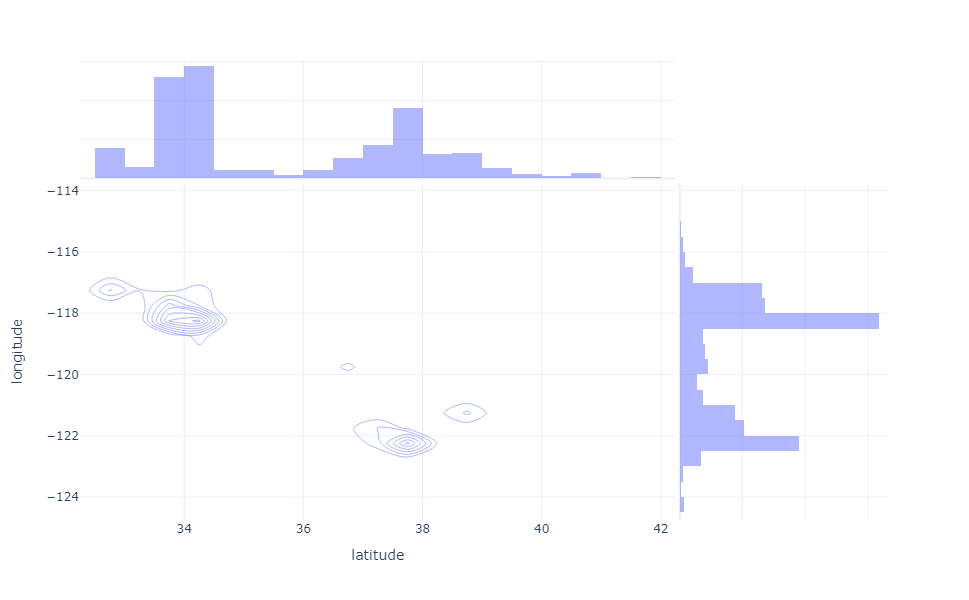

In [104]:
fig = px.density_contour(X_train, x="latitude", y="longitude", marginal_x="histogram", marginal_y="histogram",
                         template='plotly_white', width=600, height=600)
fig.show()

In [105]:
latlong = X_train[['latitude','longitude']].copy()
latlong['latA'] = latlong['latitude'].apply(lambda x: 'lat1' if x>36 else 'lat2' )
latlong['longA'] = latlong['longitude'].apply(lambda x: 'long1' if x>-120 else 'long2')
latlong['cluster'] = latlong['latA'] + latlong['longA']
latlong['cluster'].value_counts()

lat2long1    6910
lat1long2    4777
lat1long1     524
lat2long2     173
Name: cluster, dtype: int64

Visually there are clearly 2 high density clusters and 2 low density clusters. Let's try to separate them out using Gaussian Mixture Models

In [106]:
from sklearn.mixture import GaussianMixture

In [144]:
X_train1 = X_train.copy()
X_dev1 = X_dev.copy()

In [145]:
gmm_lat = GaussianMixture(n_components=2, random_state=42)
gmm_lat.fit(X_train1['latitude'].values.reshape(-1, 1))
X_train1['latitude_class'] = gmm_lat.predict(X_train1['latitude'].values.reshape(-1, 1))

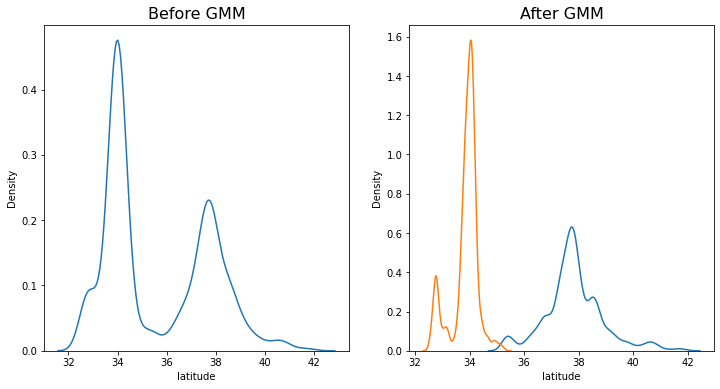

In [146]:
f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
sns.kdeplot(data=X_train1['latitude'], ax=ax[0])
ax[0].set_title('Before GMM', fontsize=16)
sns.kdeplot(data=X_train1[X_train1.latitude_class==0].latitude, label='Component 1', ax=ax[1])
sns.kdeplot(data=X_train1[X_train1.latitude_class==1].latitude, label='Component 2', ax=ax[1])
ax[1].set_title('After GMM', fontsize=16)
plt.show()

In [147]:
gmm_long = GaussianMixture(n_components=2, random_state=42)
gmm_long.fit(X_train1['longitude'].values.reshape(-1, 1))
X_train1['longitude_class'] = gmm_long.predict(X_train1['longitude'].values.reshape(-1, 1))

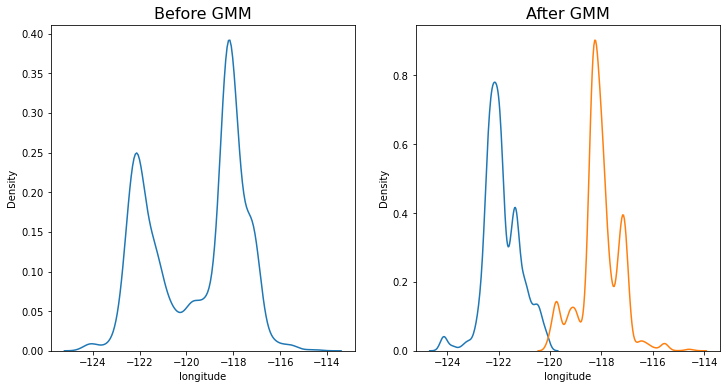

In [148]:
f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
sns.kdeplot(data=X_train1['longitude'], ax=ax[0])
ax[0].set_title('Before GMM', fontsize=16)
sns.kdeplot(data=X_train1[X_train1.longitude_class==0].longitude, label='Component 1', ax=ax[1])
sns.kdeplot(data=X_train1[X_train1.longitude_class==1].longitude, label='Component 2', ax=ax[1])
ax[1].set_title('After GMM', fontsize=16)
plt.show()

In [149]:
X_train1['latitude_class'] = X_train1['latitude_class'].astype(str)
X_train1['longitude_class'] = X_train1['longitude_class'].astype(str)
X_train1['latlongcluster'] = X_train1['latitude_class'] + X_train1['longitude_class']
X_train1 = X_train1.drop(columns=['latitude_class', 'longitude_class'])

In [150]:
X_train1['latlongcluster'].value_counts()

11    6716
00    4794
01     761
10     113
Name: latlongcluster, dtype: int64

In [151]:
X_train1 = pd.get_dummies(X_train1, columns=['latlongcluster'])
X_train1.drop(columns=['latlongcluster_00'], inplace=True)

In [114]:
def gaussian_mixture_prep(X, gmmlat, gmmlong):
    
    X_ = X.copy()
    
    X_['latitude_class'] = gmmlat.predict(X_['latitude'].values.reshape(-1, 1))
    X_['longitude_class'] = gmmlong.predict(X_['longitude'].values.reshape(-1, 1))
    X_['latitude_class'] = X_['latitude_class'].astype(str)
    X_['longitude_class'] = X_['longitude_class'].astype(str)
    X_['latlongcluster'] = X_['latitude_class'] + X_['longitude_class']
    X_ = X_.drop(columns=['latitude_class', 'longitude_class'])
    X_= pd.get_dummies(X_, columns=['latlongcluster'])
    X_.drop(columns=['latlongcluster_00'], inplace=True)
    
    return X_
    

In [152]:
X_dev1 = gaussian_mixture_prep(X_dev1,gmm_lat, gmm_long)

In [153]:
model1 = LinearRegression()
evaluate(model1,X_train1, y_train, X_dev1,y_dev)

{'Train': (0.6565648960067247, 67236.49748713251),
 'Dev': (0.6388615438450083, 69944.09309937099)}

In [154]:
X_train1a = X_train1.drop(columns=['latitude', 'longitude'])
X_dev1a = X_dev1.drop(columns=['latitude', 'longitude'])
model1a = LinearRegression()
evaluate(model1a, X_train1a, y_train, X_dev1a , y_dev)

{'Train': (0.6388265301719902, 68951.01450924309),
 'Dev': (0.6259141148569525, 71186.85981604677)}

In [155]:
X_train1b = X_train1.drop(columns=['longitude'])
X_dev1b = X_dev1.drop(columns=['longitude'])
model1b = LinearRegression()
evaluate(model1b, X_train1b, y_train, X_dev1b , y_dev)

{'Train': (0.6391292066669905, 68922.11672549267),
 'Dev': (0.6262058978733669, 71159.09190310986)}

### Feature Engineering total_rooms, total_bedrooms, population, households

In [156]:
X_train2 = X_train1.copy()
X_dev2 = X_dev1.copy()
X_test2 = X_test1.copy()

In [120]:
colcorr = ['total_rooms','total_bedrooms', 'population', 'households']

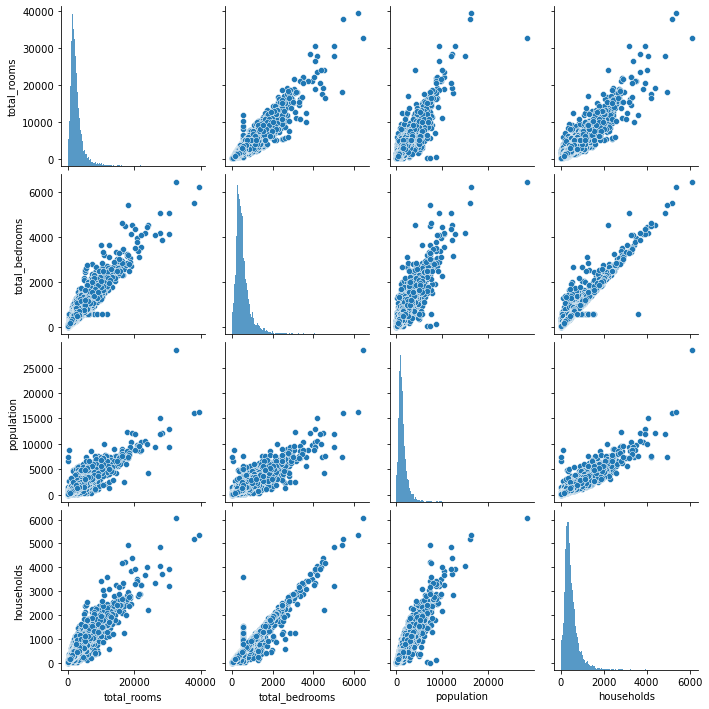

In [121]:
sns.pairplot(X_train2[colcorr])

In [157]:
X_train2['roomsperhousehold'] = X_train2['total_rooms']/X_train2['households']
X_dev2['roomsperhousehold'] = X_dev2['total_rooms']/X_dev2['households']

In [158]:
model2 = LinearRegression()
evaluate(model2,X_train2,y_train,X_dev2,y_dev)

{'Train': (0.6589481830955419, 67002.79561937685),
 'Dev': (0.6400779850127021, 69826.19559911272)}

In [159]:
model2a = LinearRegression()
coldrop2 = ['total_rooms','households','total_bedrooms']
evaluate(model2a, X_train2.drop(columns= coldrop2), y_train, X_dev2.drop(columns=coldrop2), y_dev)

{'Train': (0.6184829883199658, 70866.28943396018),
 'Dev': (0.611482268159053, 72547.02325910429)}

In [160]:
model2b = LinearRegression()
coldrop2b = ['total_rooms','households']
evaluate(model2b, X_train2.drop(columns= coldrop2b), y_train, X_dev2.drop(columns=coldrop2b), y_dev)

{'Train': (0.6538875168088423, 67498.07254110437),
 'Dev': (0.6384746220368388, 69981.55193217046)}

In [161]:
X_train3 = X_train1.copy()
X_dev3 = X_dev1.copy()

In [162]:
X_train3['total_rooms_per_person'] = X_train3['total_rooms']/X_train3['population']
X_train3['total_bedrooms_per_person'] = X_train3['total_bedrooms']/X_train3['population']
X_train3['households_per_person'] = X_train3['households']/X_train3['population']

X_dev3['total_rooms_per_person'] = X_dev3['total_rooms']/X_dev3['population']
X_dev3['total_bedrooms_per_person'] = X_dev3['total_bedrooms']/X_dev3['population']
X_dev3['households_per_person'] = X_dev3['households']/X_dev3['population']

In [163]:
model3 = LinearRegression()
evaluate(model3,X_train3,y_train, X_dev3,y_dev)

{'Train': (0.6842790225776936, 64466.554458651204),
 'Dev': (0.6771576399290933, 66131.66112076596)}

In [164]:
model3a = LinearRegression()
coldrop3 = ['population','total_rooms','total_bedrooms','households']
evaluate(model3a,X_train3.drop(columns = coldrop3), y_train, X_dev3.drop(columns = coldrop3), y_dev)

{'Train': (0.6817822450421684, 64720.95895845172),
 'Dev': (0.6723253017955978, 66624.75560401408)}

In [165]:
def latlongtoxyz(X):
    X['xcoordinate'] = np.cos(X['latitude'])*np.cos(X['longitude'])
    X['ycoordinate'] = np.cos(X['latitude'])*np.sin(X['longitude'])
    X['zcoordinate'] = np.sin(X['latitude'])
    X = X.drop(columns = ['latitude','longitude'])
    return X

In [166]:
X_train4 = X_train3.copy()
X_dev4 = X_dev3.copy()

In [167]:
X_train4 = latlongtoxyz(X_train4)
X_dev4 = latlongtoxyz(X_dev4)

In [168]:
model4 = LinearRegression()
evaluate(model4,X_train4,y_train,X_dev4,y_dev)

{'Train': (0.6845563975780486, 64438.22986038919),
 'Dev': (0.6776905486970592, 66077.0575405294)}

In [169]:
X_train4.columns.to_list()

['housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income',
 'ocean_proximity_<1H OCEAN',
 'ocean_proximity_INLAND',
 'ocean_proximity_NEAR BAY',
 'ocean_proximity_NEAR OCEAN',
 'latlongcluster_01',
 'latlongcluster_10',
 'latlongcluster_11',
 'total_rooms_per_person',
 'total_bedrooms_per_person',
 'households_per_person',
 'xcoordinate',
 'ycoordinate',
 'zcoordinate']

In [183]:
coeflr = model4.coef_

## Other Algorithms

In [170]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor

In [171]:
rfregressor = RandomForestRegressor(random_state=10)
evaluate(rfregressor,X_train4,y_train,X_dev4,y_dev)

{'Train': (0.9739898653221065, 18503.50663822795),
 'Dev': (0.8019069571150176, 51802.26944291096)}

In [172]:
gbregressor = GradientBoostingRegressor(random_state=10)
evaluate(gbregressor, X_train4, y_train, X_dev4, y_dev)

{'Train': (0.8145298227606929, 49410.56082404055),
 'Dev': (0.7764857823870044, 55025.84895139547)}

In [175]:
from xgboost import XGBRegressor

In [178]:
X_train5 = X_train4.copy()
X_dev5 = X_dev4.copy()

X_train5.rename(columns={'ocean_proximity_<1H OCEAN' : 'ocean_proximity_1H OCEAN'}, inplace=True)
X_dev5.rename(columns={'ocean_proximity_<1H OCEAN' : 'ocean_proximity_1H OCEAN'}, inplace=True)

In [179]:
xgb = XGBRegressor()
evaluate(xgb, X_train5, y_train, X_dev5, y_dev)

C:\Users\91902\anaconda3\lib\site-packages\xgboost\data.py:262: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



{'Train': (0.9521651511788729, 25093.136130343795),
 'Dev': (0.8170613488309892, 49781.37766197605)}

## Most Important Features

In [184]:
def plotcoefficients(features, values):
    plt.figure(figsize=(12,6))
    plt.bar(features,values)
    plt.xticks(rotation=70)
    plt.show()

In [186]:
ss = StandardScaler()
X_train4a = ss.fit_transform(X_train4)
X_dev4a = ss.transform(X_dev4)

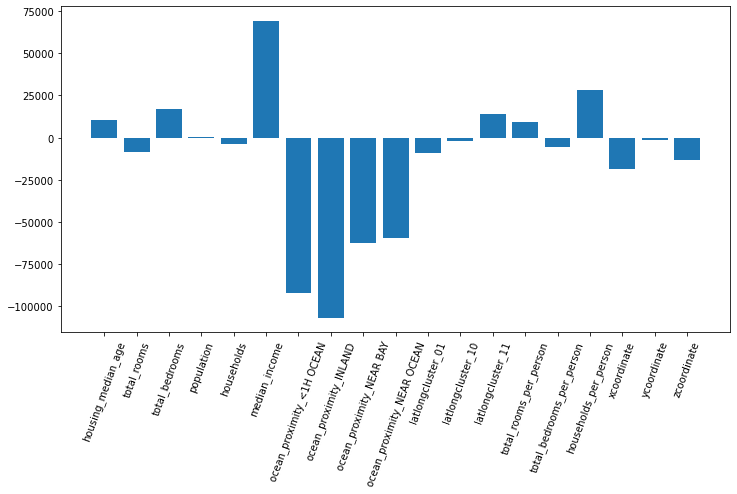

In [187]:
linreg = LinearRegression()
linreg.fit(X_train4a,y_train)
coeflr = linreg.coef_
plotcoefficients(X_train4.columns, coeflr.reshape(-1))

In [189]:
gbreg = GradientBoostingRegressor(random_state=10)
gbreg.fit(X_train4a,y_train)
feat_imp = gbreg.feature_importances_

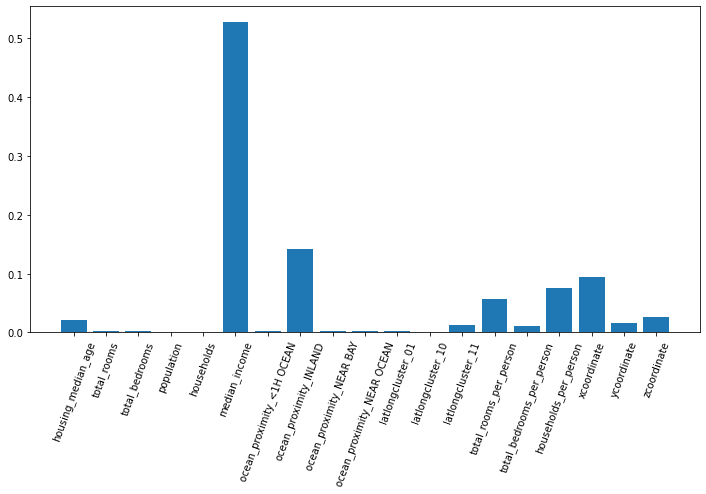

In [191]:
plotcoefficients(X_train4.columns,feat_imp)

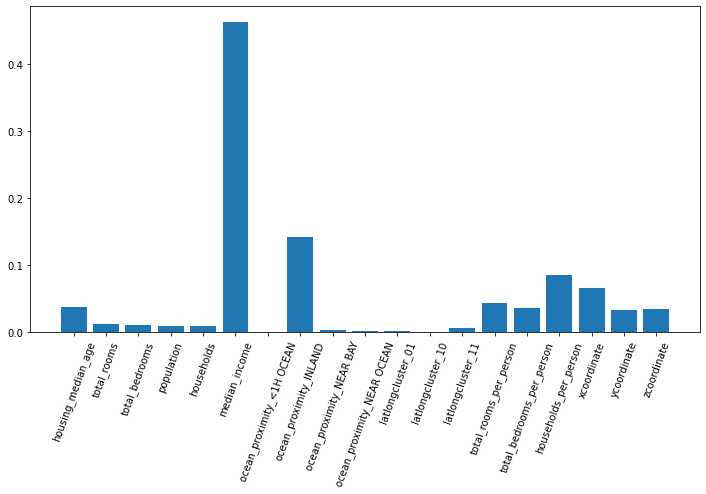

In [192]:
rfreg = RandomForestRegressor(random_state=10)
rfreg.fit(X_train4a,y_train)
feat_imp_rf = rfreg.feature_importances_
plotcoefficients(X_train4.columns,feat_imp_rf)

In [193]:
from joblib import load, dump

In [194]:
dump(gmm_lat,"models/gmmlat.joblib")
dump(gmm_long, "models/gmmlong.joblib")
dump(ss, "models/standardscaler.joblib")
dump(linreg, "models/linearmodel.joblib")

['models/linearmodel.joblib']